# DATA SET

A company Gem Stones Co Pvt. Ltd, is a cubic zirconia manufacturer. The dataset contains the prices and other attributes of almost 27,000 cubic zirconia (which is an inexpensive diamond alternative with many of the same qualities as a diamond). The company is earning different profits on different prize slots. In this project, we are predicting the price for the stone on the basis of the details given in the dataset, distinguished as higher profitable stones and lower profitable stones so as to have the better profit share. The top most relevant attributes associated with this project are:

The following is the description of the features:

Carat: Carat weight of the cubic zirconia.

Cut: Describe the cut quality of the cubic zirconia.Quality is increasing order Fair, Good, Very Good,Premium,Ideal.

Color: Colour of the cubic zirconia.With D being the best and J the worst.

Clarity :cubic zirconia Clarity refers to the absence of the Inclusions and Blemishes. (In order from Best to Worst, FL = 1. flawless, I3= level 3 inclusions) FL, IF, VVS1, VVS2, VS1, VS2, SI1, SI2, I1, I2, I3

Depth : The Height of a cubic zirconia, measured from the Culet to the table, divided by its average Girdle Diameter.

Table : The Width of the cubic zirconia's Table expressed as a percentage of its Average Diameter.

Price : the Price of the cubic zirconia.

X : Length of the cubic zirconia in mm.

Y : Width of the cubic zirconia in mm.

Z : Height of the cubic zirconia in mm.

## Importing Libraries 

In [1]:
# Importing all libraries necessary for the assignment
import pandas as pd
import numpy as np
import sklearn
from sklearn.model_selection import train_test_split
import random
from sklearn.ensemble import RandomForestRegressor
#from sklearn.inspection import plot_partial_dependence
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns

# Building pipelins of standard scaler and model for varios regressors.
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline


from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor

from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn import metrics 


plt.rcParams["figure.figsize"] = (32, 24)

In [2]:
cubic_df = pd.read_csv("C:/Users/prana/Downloads/cubic_zirconia.csv")

In [3]:
print(cubic_df)

       Unnamed: 0  carat        cut color clarity  depth  table     x     y  \
0               1   0.30      Ideal     E     SI1   62.1   58.0  4.27  4.29   
1               2   0.33    Premium     G      IF   60.8   58.0  4.42  4.46   
2               3   0.90  Very Good     E    VVS2   62.2   60.0  6.04  6.12   
3               4   0.42      Ideal     F     VS1   61.6   56.0  4.82  4.80   
4               5   0.31      Ideal     F    VVS1   60.4   59.0  4.35  4.43   
...           ...    ...        ...   ...     ...    ...    ...   ...   ...   
26962       26963   1.11    Premium     G     SI1   62.3   58.0  6.61  6.52   
26963       26964   0.33      Ideal     H      IF   61.9   55.0  4.44  4.42   
26964       26965   0.51    Premium     E     VS2   61.7   58.0  5.12  5.15   
26965       26966   0.27  Very Good     F    VVS2   61.8   56.0  4.19  4.20   
26966       26967   1.25    Premium     J     SI1   62.0   58.0  6.90  6.88   

          z  price  
0      2.66    499  
1      2.

# DATA PREPROCESSING

In [4]:
cubic_df.isnull().sum()

Unnamed: 0      0
carat           0
cut             0
color           0
clarity         0
depth         697
table           0
x               0
y               0
z               0
price           0
dtype: int64

In [5]:
cubic_df.drop('Unnamed: 0', axis = 1, inplace= True)

In [6]:
cubic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26967 entries, 0 to 26966
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    26967 non-null  float64
 1   cut      26967 non-null  object 
 2   color    26967 non-null  object 
 3   clarity  26967 non-null  object 
 4   depth    26270 non-null  float64
 5   table    26967 non-null  float64
 6   x        26967 non-null  float64
 7   y        26967 non-null  float64
 8   z        26967 non-null  float64
 9   price    26967 non-null  int64  
dtypes: float64(6), int64(1), object(3)
memory usage: 2.1+ MB


## Removing Duplicates


In [7]:
duplicate_rows = cubic_df[cubic_df.duplicated()]
print("No. of duplicate rows: ", duplicate_rows.shape[0])

No. of duplicate rows:  34


In [8]:
cubic_df.drop_duplicates(inplace=True)
print("No. of rows after dropping duplicates: ", cubic_df.shape[0])

No. of rows after dropping duplicates:  26933


## Imputation using median

In [9]:
print("Median- {:.2f}".format(cubic_df['depth'].median()))

Median- 61.80


In [10]:
cubic_df['depth'].fillna(61.8, inplace=True)

In [11]:
print("Median- {:.2f}".format(cubic_df['price'].median()))

Median- 2375.00


In [12]:
cubic_df['price'].fillna(2375.00, inplace=True)

In [13]:
cubic_df.isnull().sum()

carat      0
cut        0
color      0
clarity    0
depth      0
table      0
x          0
y          0
z          0
price      0
dtype: int64

## Imputation using Mean


In [14]:
print("Mean- {:.2f}".format(cubic_df['depth'].mean()))

Mean- 61.75


In [15]:
cubic_df['depth'].fillna(61.75, inplace=True)

# EXPLORATORY DATA ANALYSIS (EDA)

## Analysis of Categorical columns

#### By Cut

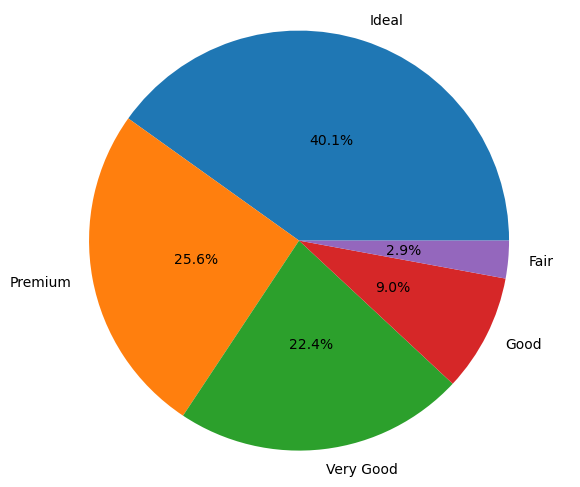

In [16]:
#By Cut
x = cubic_df['cut'].value_counts().values
plt.figure(figsize=(7, 6))
plt.pie(x, center=(0, 0), radius=1.5, labels=cubic_df['cut'].unique(), autopct='%1.1f%%', pctdistance=0.5)
plt.axis('equal')
plt.show()

#### By Color

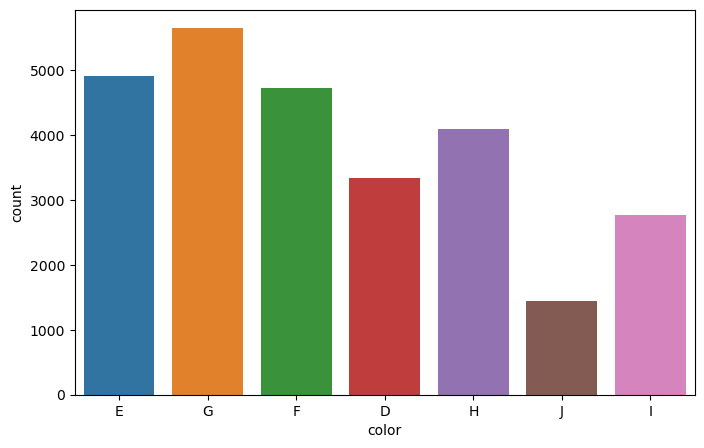

In [17]:
#By Color
plt.figure(figsize=(8, 5))
sns.countplot(x='color', data=cubic_df)
plt.show()

#### By Clarity

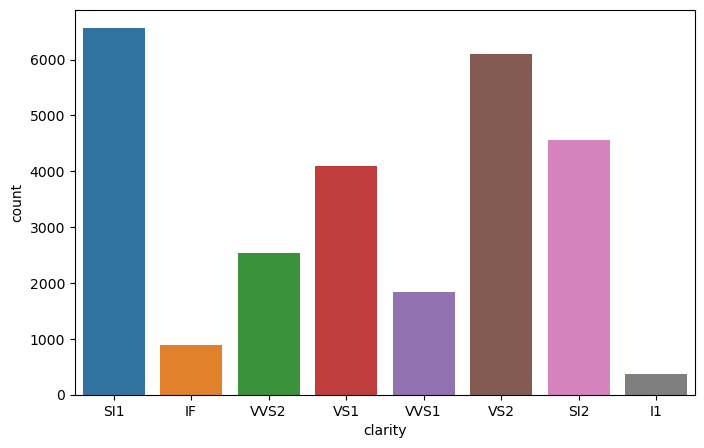

In [18]:
#By Clarity
plt.figure(figsize=(8, 5))
sns.countplot(x='clarity', data=cubic_df)
plt.show()

## Analysis of Numerical columns

In [19]:
numerical_data = cubic_df.select_dtypes(include='number')
num_cols = numerical_data.columns
print("Numerical columns: ", num_cols)

Numerical columns:  Index(['carat', 'depth', 'table', 'x', 'y', 'z', 'price'], dtype='object')


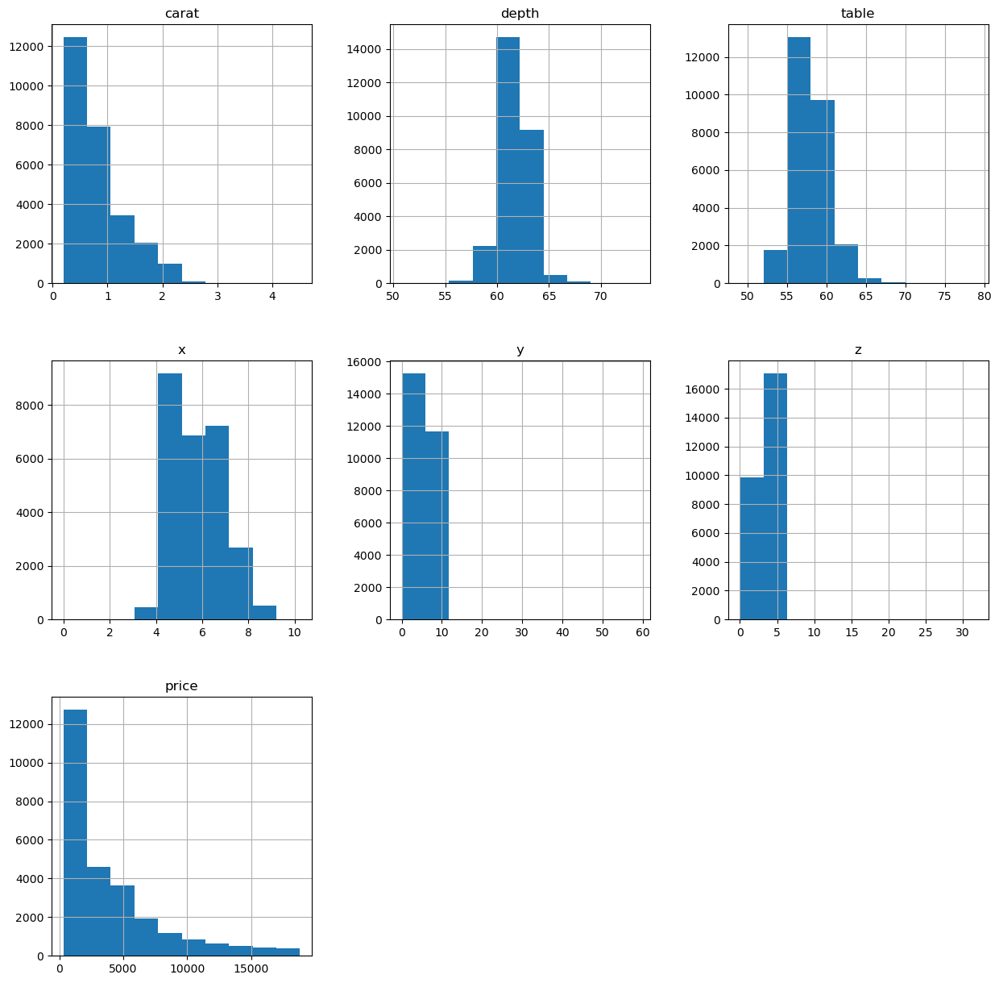

In [20]:
cubic_df[num_cols].hist(figsize=(15, 15))
plt.show()

## What are the distributions of the predictor variables?

All independent variables seem to roughly follow normal distribution based on the Q-Q plots.

From the above plotted histogram for numerical features, we can clearly see that the 'price' and 'carat' columns are highly skewed towards the right.

From the above plotted pie and countplots for categorical features - Cut, Color and Clarity are categorical features.

Cut has categorical values namely Ideal, Good, Very Good, Premium and Fair.

Color has categorical values namely E, G, F, D, H, J and I.

Clarity has categorical values namely SI1, IF, VVS2, VS1, VVS1, VS2, SI2 and I1

## Checking Outliers

<Axes: >

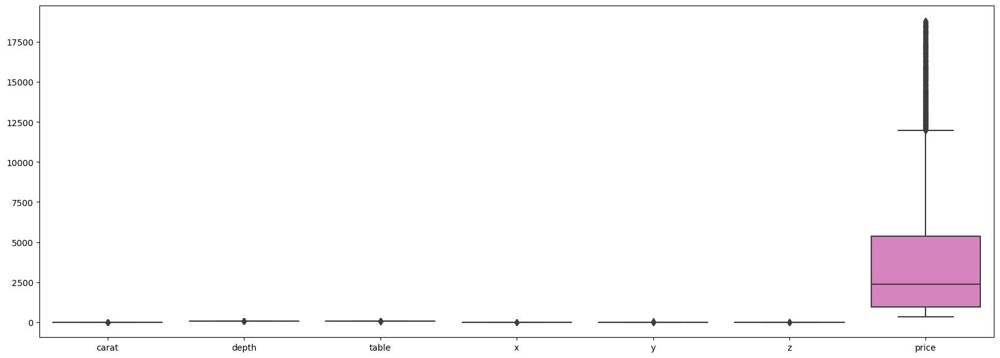

In [21]:
#Checking the Ranges of the predictor variables and dependent variable after normalizing
plt.figure(figsize=(20,7))
sns.boxplot(data=cubic_df)

Do the ranges of the predictor variables make sense?
Inferring from the box plot above Carat, Depth consists of outliers.

All the predictor variables range between the scale of 0-10 except depth and table.

'price' and 'carat' columns are highly skewed towards the right.

Cut, Color and Clarity are categorical features.

## Removing Outliers

In [22]:
numerical_df = cubic_df.select_dtypes(include='number')
num_cols = numerical_df.columns
print("Numerical columns: ", num_cols)

Numerical columns:  Index(['carat', 'depth', 'table', 'x', 'y', 'z', 'price'], dtype='object')


In [23]:
#Removing outliers
Q1 = cubic_df[num_cols].quantile(0.25)
Q3 = cubic_df[num_cols].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

carat       0.65
depth       1.40
table       3.00
x           1.84
y           1.83
z           1.14
price    4411.00
dtype: float64


In [24]:
num_cols=cubic_df.select_dtypes(['float64'])
for col in num_cols:
   Q1 = cubic_df[col].quantile(0.25)
   Q3 = cubic_df[col].quantile(0.75) 
   IQR=Q3-Q1
   cubic_df=cubic_df[~((cubic_df[col]<(Q1-1.5*IQR)) | (cubic_df[col]>(Q3+1.5*IQR)))]

print("No. of rows remaining: ", cubic_df.shape[0])

No. of rows remaining:  24719


## After Removal of Outliers

<Axes: >

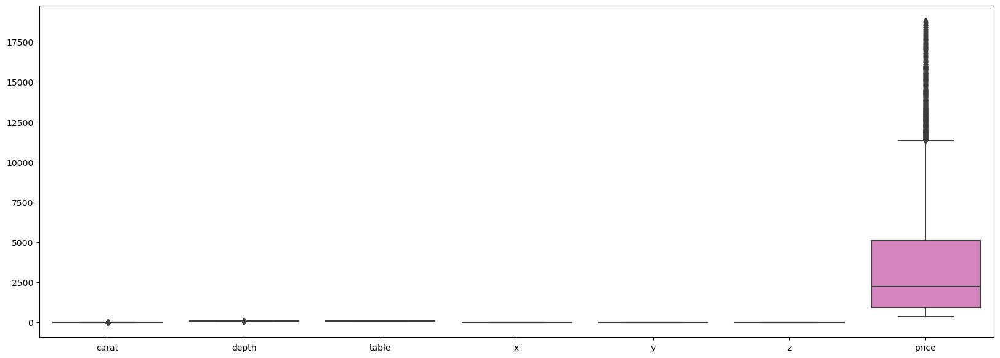

In [25]:
plt.figure(figsize=(20,7))
sns.boxplot(data=cubic_df)

## Data Correlation

<Axes: >

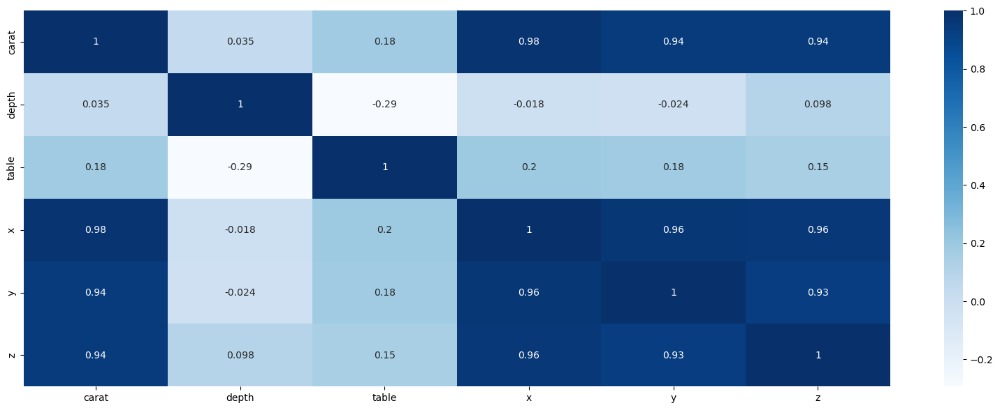

In [26]:
plt.figure(figsize=(20,7))
sns.heatmap(num_cols.corr(), annot=True, cmap="Blues")

The dimension columns x, y, and z have strong relationships with one another. Each of the dimension columns has a strong correlation with the "carat" columns. As a result, we could eliminate one or two of these columns to prevent multi-collinearity.

# Checking the correlation of independent variables with dependent variable -

The output column "price" and the columns "depth" and "table" exhibit noticeably low correlations (0.02 and 0.18, respectively). They are not making a significant impact on the creation of a specific result. So, in order to lower the dataset's dimensionality, they must be eliminated.



Is there any multicollinearity in the model?

When one independent variable is related to another independent variable that is its highly correlated then multicollinearity exists in the model. It’s an issue as it undermines the statistical significance of an independent variable. Multicollinearity can be determined by computing correlation matrix or calculating VIF value of all variables. In correlation matrix a coefficient closer to +1 or -1 tells us that those two variables are highly correlated. For VIF values a value above 10 tells us that multicollinearity exists. In this model the dimension columns x, y, and z have strong relationships with one another. Each of the dimension columns has a strong correlation with the "carat" columns. The output column "price" and the columns "depth" and "table" exhibit noticeably low correlations (0.02 and 0.18, respectively). They are not making a significant impact on the creation of a specific result.


In the multivariate models are predictor variables independent of all the other predictor variables?

Variables are said to be independent when there is no relation between them. To check this relation, correlation matrix can be used. No, they are not independent of each other. There is multi - collinearity among lot of the independent variable which is shown by the correlation table and pair plot map. Here z and x, z and y, z and carat, y and carat, x and carat are all highly correlated.

# Plotting the Q-Q Plot

<Figure size 800x500 with 0 Axes>

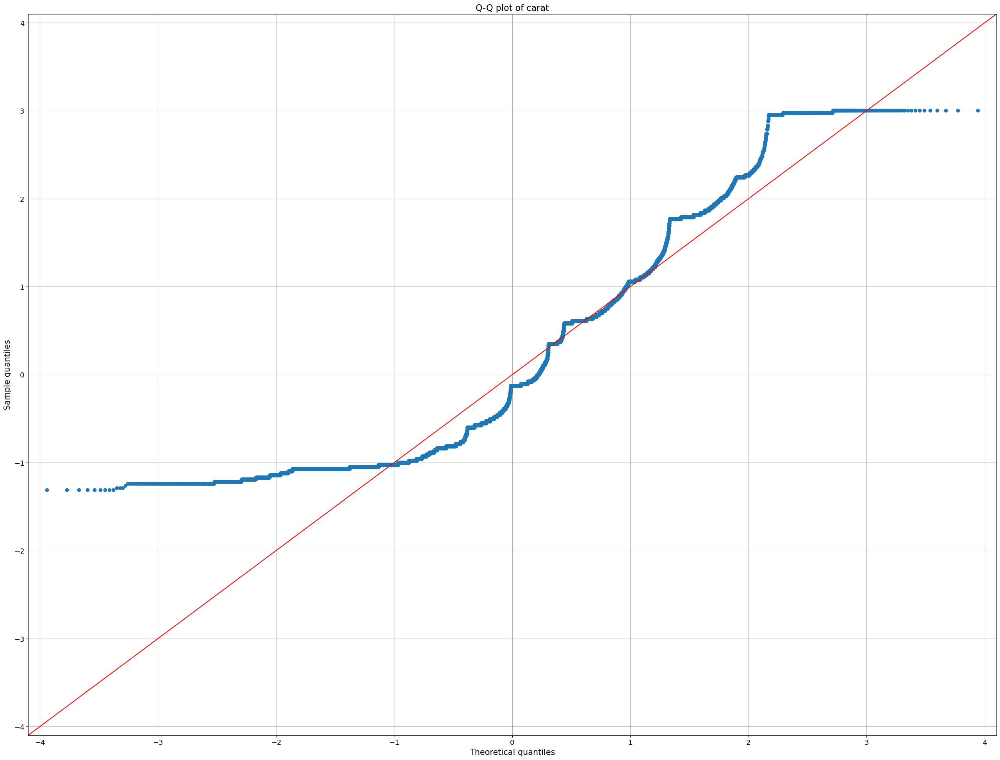

<Figure size 800x500 with 0 Axes>

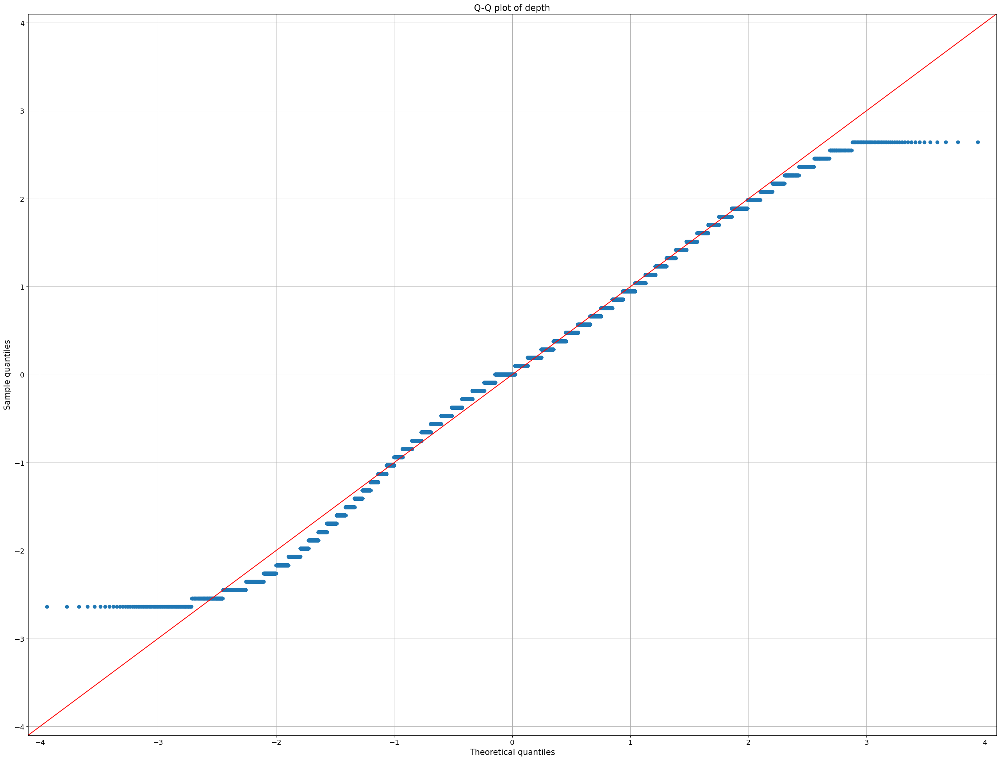

<Figure size 800x500 with 0 Axes>

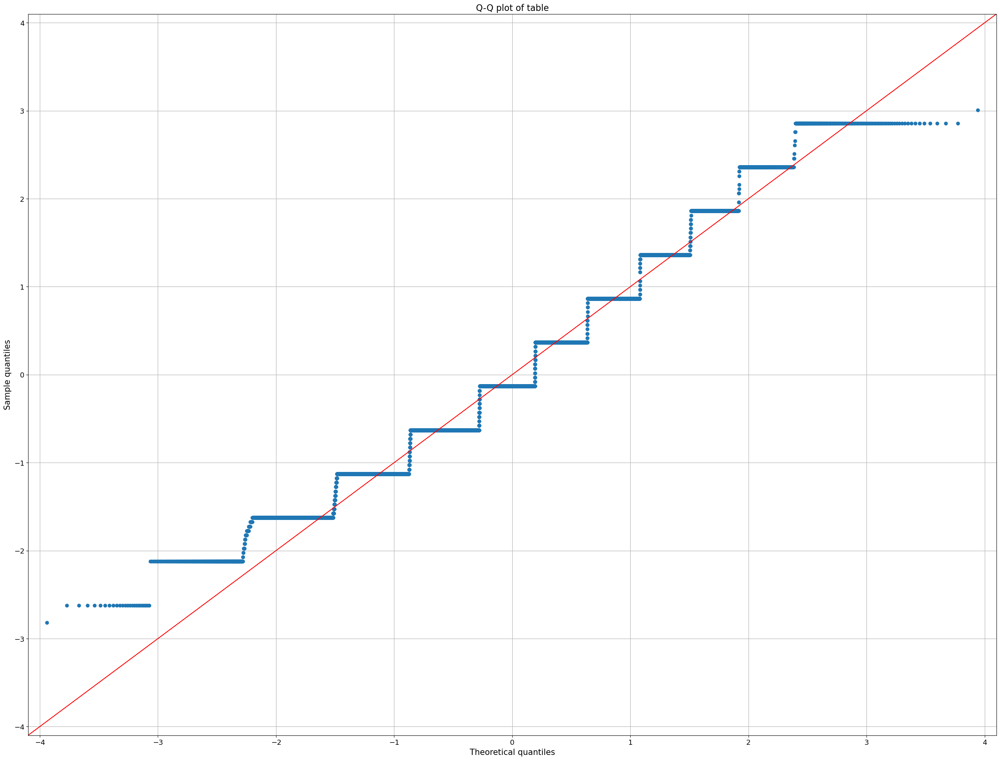

<Figure size 800x500 with 0 Axes>

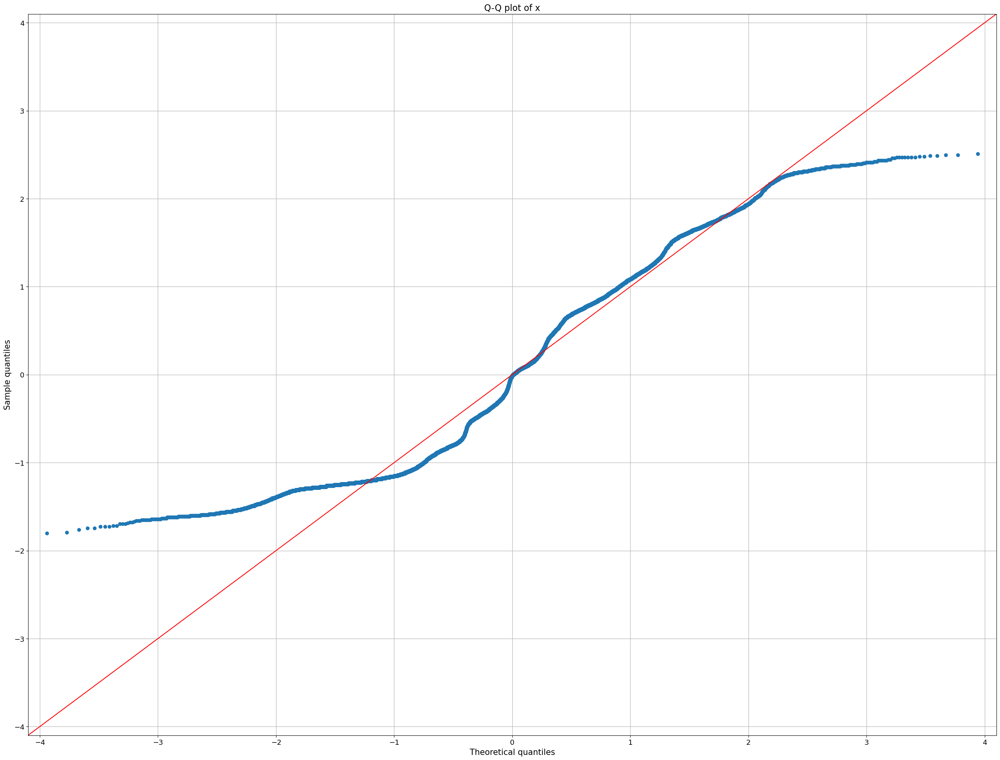

<Figure size 800x500 with 0 Axes>

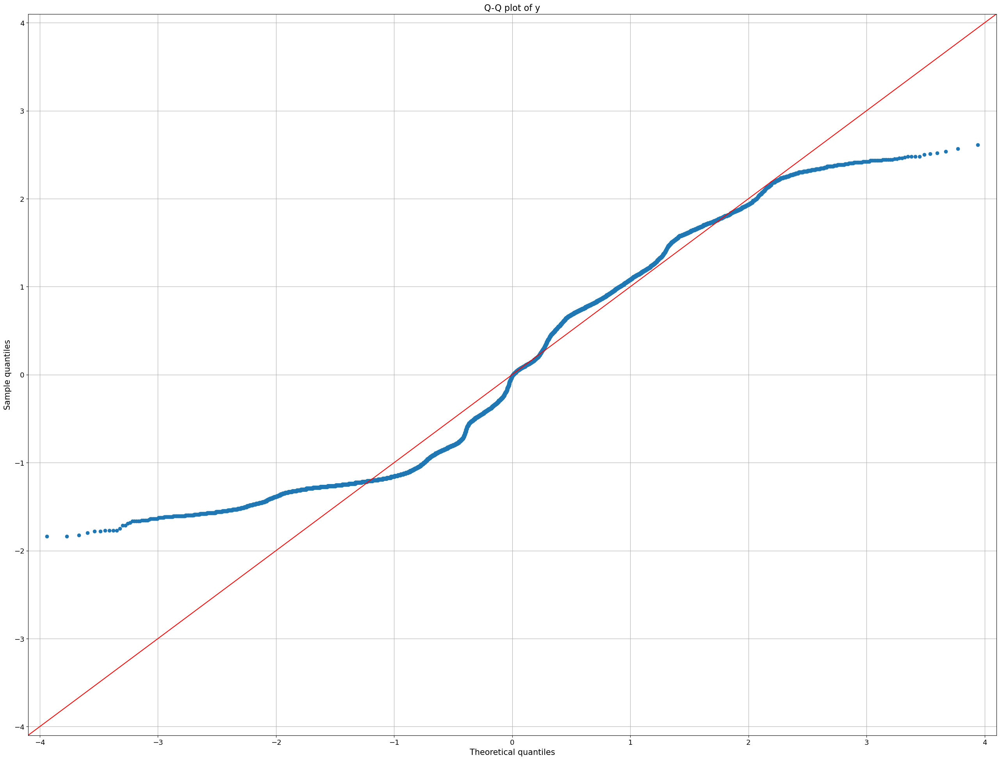

<Figure size 800x500 with 0 Axes>

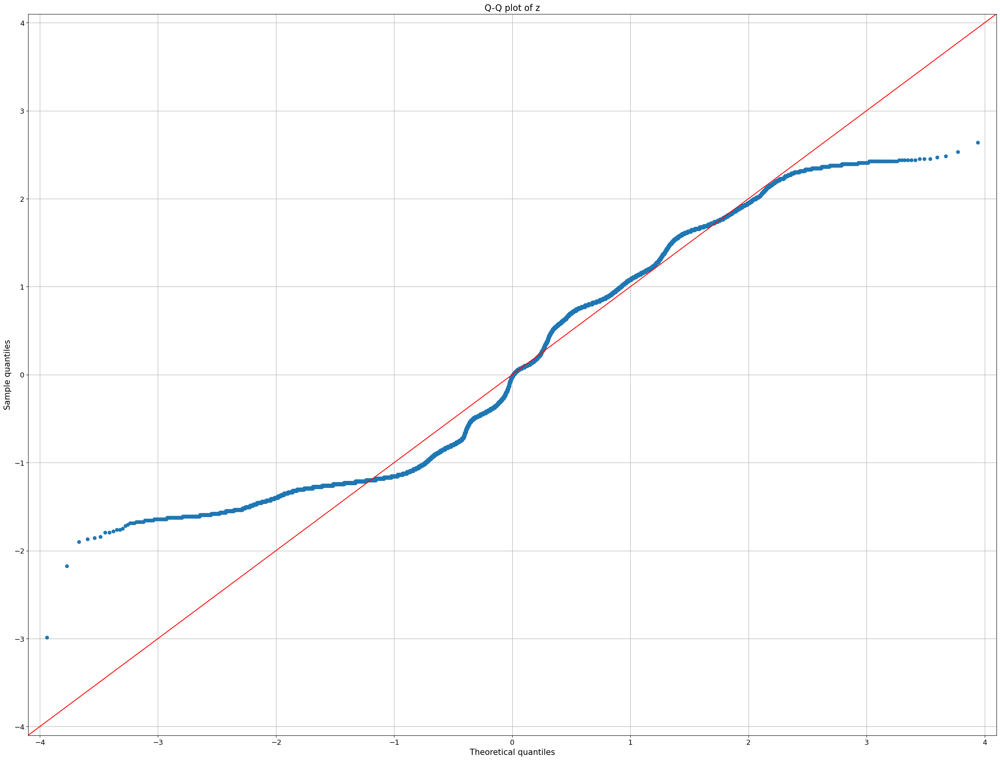

<Figure size 800x500 with 0 Axes>

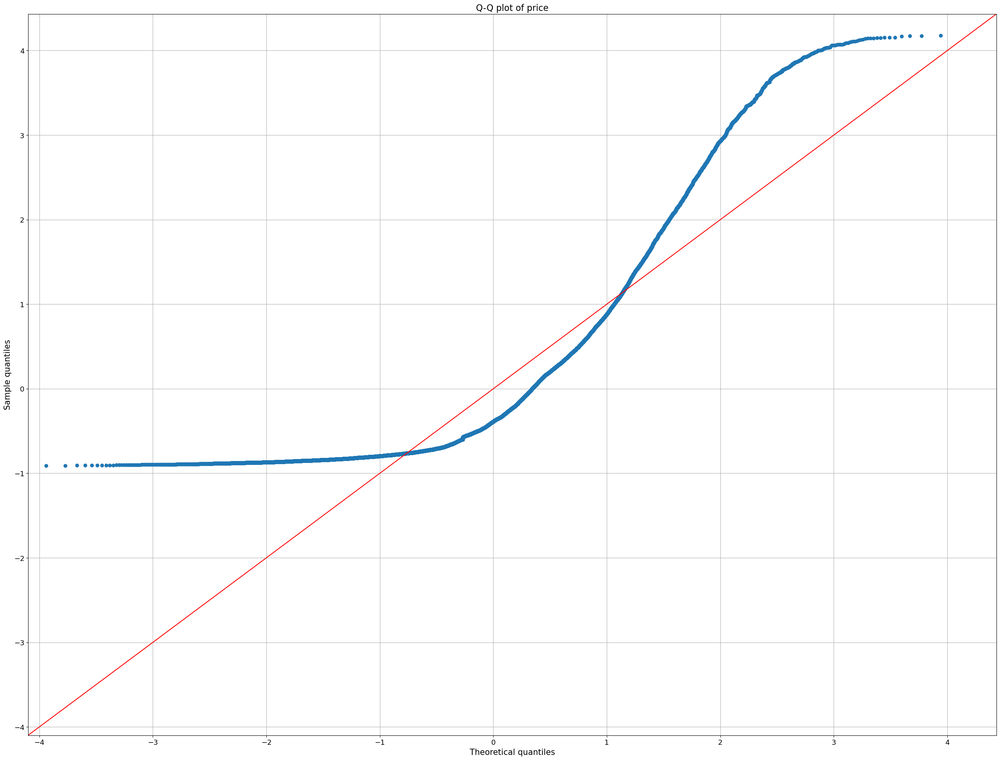

In [27]:
#checking the distribution of independent variables
from statsmodels.graphics.gofplots import qqplot
data_norm=cubic_df[['carat', 'depth',
       'table', 'x', 'y', 'z','price']]
for c in data_norm.columns[:]:
  plt.figure(figsize=(8,5))
  fig=qqplot(data_norm[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

### All independent variables seem to roughly follow normal distribution based on the Q-Q plots.

# FEATURE ENGINEERING

## One Hot Encoding

In [28]:
#One hot encoding
cat_feature=[feature for feature in cubic_df.columns if cubic_df[feature].dtype=='O']
print(cat_feature)

['cut', 'color', 'clarity']


In [29]:
cubic_df['cut'].unique()

array(['Ideal', 'Premium', 'Very Good', 'Good', 'Fair'], dtype=object)

In [30]:
cubic_df['cut']=cubic_df['cut'].map({"Ideal":0,'Premium':1,"Very Good":2,'Good':3,"Fair":4})

In [31]:
print(cubic_df['color'].unique())
print(cubic_df['clarity'].unique())

['E' 'G' 'F' 'D' 'H' 'J' 'I']
['SI1' 'IF' 'VVS2' 'VS1' 'VVS1' 'VS2' 'SI2' 'I1']


In [32]:
from sklearn.preprocessing import LabelEncoder
labelencoder=LabelEncoder()

In [33]:
for feature in ['color','clarity']:
    cubic_df[feature]=labelencoder.fit_transform(cubic_df[feature])
cubic_df

,carat,cut,color,clarity,depth,table,x,y,z,price
0,0.30,0,1,2,62.1,58.0,4.27,4.29,2.66,499
1,0.33,1,3,1,60.8,58.0,4.42,4.46,2.70,984
2,0.90,2,1,7,62.2,60.0,6.04,6.12,3.78,6289
3,0.42,0,2,4,61.6,56.0,4.82,4.80,2.96,1082
4,0.31,0,2,6,60.4,59.0,4.35,4.43,2.65,779
...,...,...,...,...,...,...,...,...,...,...
26962,1.11,1,3,2,62.3,58.0,6.61,6.52,4.09,5408
26963,0.33,0,4,1,61.9,55.0,4.44,4.42,2.74,1114
26964,0.51,1,1,5,61.7,58.0,5.12,5.15,3.17,1656
26965,0.27,2,2,7,61.8,56.0,4.19,4.20,2.60,682


## Data Normalization

In [34]:
# One Hot Encoding
dummies_variables = ['cut', 'color', 'clarity']
dummies = pd.get_dummies(cubic_df[dummies_variables], drop_first= True)

data = pd.concat([cubic_df, dummies], axis=1)
data = data.drop(['cut', 'color', 'clarity'],axis=1)

from sklearn.preprocessing import MinMaxScaler

# Scaling of Numerical Features
scaler = MinMaxScaler()

num_vars = ['carat', 'depth', 'table', 'x', 'y', 'z', 'price']
data[num_vars] = scaler.fit_transform(data[num_vars])

In [35]:
#data after nromalizing and feature creation
data.head()

,carat,depth,table,x,y,z,price
0,0.054945,0.553571,0.547009,0.118421,0.123932,0.307065,0.009355
1,0.071429,0.321429,0.547009,0.151316,0.160256,0.317935,0.035583
2,0.384615,0.571429,0.717949,0.506579,0.514957,0.611413,0.322464
3,0.120879,0.464286,0.376068,0.239035,0.232906,0.388587,0.040883
4,0.060440,0.250000,0.632479,0.135965,0.153846,0.304348,0.024497


## Identifying predictor significance
### Using OLS for finding the p value to check the significant features

In [36]:
#Identifing predictor significance
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(cubic_df['price'], cubic_df[['carat', 'cut', 'color', 'clarity', 'depth',
       'table', 'x', 'y', 'z']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  price   R-squared (uncentered):                   0.945
Model:                            OLS   Adj. R-squared (uncentered):              0.945
Method:                 Least Squares   F-statistic:                          4.680e+04
Date:                Fri, 19 Apr 2024   Prob (F-statistic):                        0.00
Time:                        19:46:25   Log-Likelihood:                     -2.1052e+05
No. Observations:               24719   AIC:                                  4.211e+05
Df Residuals:                   24710   BIC:                                  4.211e+05
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
carat       1.432e+04    102.860    139.192      0.000    1.41e+04    1.45e+04
cut         -154.5390      8.911    -17.342      0.000    -172.005    -137.073
color       -284.2426      4.736    -60.015      0.000    -293.526    -274.959
clarity      257.0165      4.571     56.228      0.000     248.057     265.976
depth        129.0349      4.532     28.472      0.000     120.152     137.918
table        -33.1778      4.264     -7.781      0.000     -41.536     -24.820
x          -2604.3233    152.536    -17.073      0.000   -2903.304   -2305.343
y           2721.1137    140.744     19.334      0.000    2445.248    2996.980
z          -4022.2853    157.302    -25.571      0.000   -4330.606   -3713.965
==============================================================================
Omnibus:                     8320.037   Durbin-Watson:                   2.009
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            95554.837
Skew:                           1.287   Prob(JB):                         0.00
Kurtosis:                      12.282   Cond. No.                     2.20e+03
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 2.2e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.

Considering the significance value of 0.05

The carat has the p-value 0, which is lesser and hence it is a significant feature.

The cut has the p-value 0, which is lesser and hence it is a significant feature.

The color has the p-value 0, which is lesser and hence it is a significant feature.

The Clarity has the p-value 0, which is lesser and hence it is a significant feature.

The Depth has the p-value 0, which is lesser and hence it is a significant feature.

The Table has the p-value 0, which is lesser and hence it is a significant feature.

The x has the p-value 0, which is lesser and hence it is a significant feature.

The y has the p-value 0, which is lesser and hence it is a significant feature.

The z has the p-value 0, which is lesser and hence it is a significant feature.



Is the relationship significant?

A relationship is said to be statistically significant when the p value for the variables is less than 0.05.P value is probability of obtaining a result at least as extreme as the current one, assuming null hypothesis is true. P-value was calculated by two ways for this model. From the OLS method it was observed that values of p for all independent variables is 0 which indicates that all are significant. Hence for the chosen dataset it can be concluded that the relationship is significant.

## Splitting the data into training and testing


In [37]:
X= data.drop(["price"],axis =1)
y= data["price"]
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.20, random_state=25)

In [38]:
data.isnull().sum()

carat    0
depth    0
table    0
x        0
y        0
z        0
price    0
dtype: int64

In [39]:
X_train.head()

,carat,depth,table,x,y,z
24939,0.445055,0.357143,0.376068,0.598684,0.594017,0.657609
783,0.186813,0.464286,0.376068,0.333333,0.333333,0.464674
14835,0.719780,0.321429,0.547009,0.804825,0.811966,0.815217
19742,0.329670,0.625000,0.290598,0.491228,0.474359,0.595109
26158,0.445055,0.678571,0.717949,0.585526,0.561966,0.671196


In [40]:
y_train.head()

24939    0.353072
783      0.132490
14835    0.400011
19742    0.120430
26158    0.505137
Name: price, dtype: float64

# MODEL DEVELOPMENT

In [41]:
# Building pipelins of standard scaler and model for varios regressors.



pipeline_lr=Pipeline([("scalar1",StandardScaler()),
                     ("lr",LinearRegression())])

pipeline_xgb=Pipeline([("scalar2",StandardScaler()),
                     ("xgb",XGBRegressor())])

pipeline_rf=Pipeline([("scalar3",StandardScaler()),
                     ("rf",RandomForestRegressor())])

pipeline_kn=Pipeline([("scalar4",StandardScaler()),
                     ("kn",KNeighborsRegressor())])

pipeline_dt=Pipeline([("scalar5",StandardScaler()),
                     ("dt",DecisionTreeRegressor())])

# List of all the pipelines
pipelines = [pipeline_lr, pipeline_xgb,pipeline_rf, pipeline_kn, pipeline_dt]

# Dictionary of pipelines and model types for ease of reference
pipeline_dict = {0: "LinearRegression", 1: "XGBRegressor", 2: "RandomForest", 3: "KNeighbors", 4: "DecisionTree"}

# Fit the pipelines
for pipe in pipelines:
    pipe.fit(X_train, y_train)

# MODEL INTERPRETABILITY AND EVALUATION

In [42]:
cv_results_rms = []
for i, model in enumerate(pipelines):
    cv_score = cross_val_score(model, X_train,y_train,scoring="neg_root_mean_squared_error", cv=16)
    cv_results_rms.append(cv_score)
    print("%s: %f " % (pipeline_dict[i], -1 * cv_score.mean()))

LinearRegression: 0.073707 
XGBRegressor: 0.073977 
RandomForest: 0.073450 
KNeighbors: 0.076620 
DecisionTree: 0.100262 


Based on the model development process and evaluation metrics, here are some interpretations, actionable insights, and considerations for the gemstone price prediction:

### Model Evaluation:

The models were evaluated using the root mean squared error (RMSE) as the performance metric during cross-validation.

Among the models tested, Linear Regression and XGBRegressor achieved the lowest average RMSE, indicating better performance in predicting gemstone prices.

In [43]:
# Model prediction on test data with XGBClassifier which gave us the least RMSE 
pred = pipeline_lr.predict(X_test)
print("LinearRegression R^2:",1 - (1-metrics.r2_score(y_test, pred))*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1))
pred = pipeline_xgb.predict(X_test)
print("XGBoost R^2:",1 - (1-metrics.r2_score(y_test, pred))*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1))
pred = pipeline_rf.predict(X_test)
print("Random Forest R^2:",1 - (1-metrics.r2_score(y_test, pred))*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1))
pred = pipeline_kn.predict(X_test)
print("KNeighbors R^2:",1 - (1-metrics.r2_score(y_test, pred))*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1))
pred = pipeline_dt.predict(X_test)
print("DecisionTree:",1 - (1-metrics.r2_score(y_test, pred))*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1))

LinearRegression R^2: 0.860206831017835
XGBoost R^2: 0.8558723387657232
Random Forest R^2: 0.856826895199857
KNeighbors R^2: 0.8435910125409034
DecisionTree: 0.7563698226112296


### Model Interpretability:

R-squared (R^2) values were calculated to assess the models' predictive power on the test data.

R^2 values indicate the proportion of variance in the gemstone prices explained by the models. Higher R^2 values signify better fit and predictive ability.

Linear Regression achieved the highest R^2 value, followed closely by XGBoost and Random Forest. KNeighbors and Decision Tree models exhibited slightly lower R^2 values.

### Insights

Based on the evaluation results, Linear Regression appears to be the most interpretable and effective model for gemstone price prediction, as it achieves the highest R^2 score.

XGBoost and Random Forest models also perform well and can be considered as alternative options.

Important features identified by the models can provide valuable insights into the factors influencing gemstone prices, such as carat weight, cut quality, color, and clarity.

These insights can inform pricing strategies, quality control measures, and market segmentation approaches for the gemstone manufacturing company.

### Limitations and Challenges:

While the models demonstrate strong predictive performance, it's essential to consider potential limitations and challenges.

The dataset may not capture all relevant factors influencing gemstone prices, leading to potential model bias or underfitting.

External factors such as economic conditions, consumer preferences, and market trends may also impact gemstone prices but are not accounted for in the dataset.

Continuous refinement and validation of the models are necessary to ensure robustness and accuracy in real-world applications.

# Innovative Visualizations

In [44]:
import plotly.express as px

# Create 3D scatter plot
fig_3d = px.scatter_3d(data_frame=data, x='carat', y='table', z='depth', color='price',
                       title='3D Scatter Plot of Carat, Depth, and Price colored by Color')
fig_3d.update_layout(scene=dict(xaxis_title='Carat', yaxis_title='Price', zaxis_title='Depth'))

# Show plot
fig_3d.show()



# Conclusion
It is evident from the examination of the data set that there is multicolinearity and that all dependent variables are important. The best model for predicting the prices of gemstones is the Linear Regressor Model.

